## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import os
%matplotlib inline


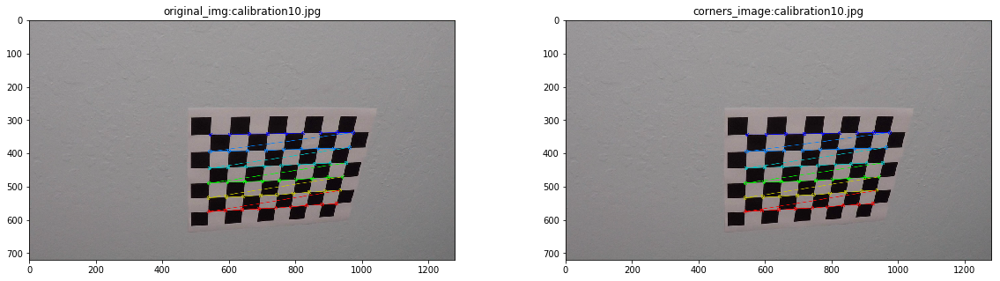

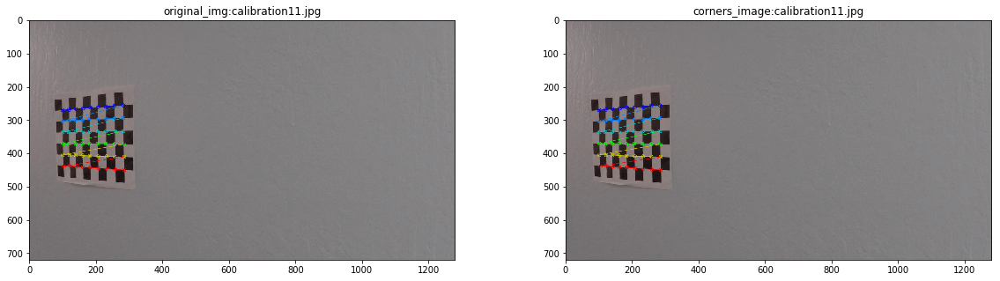

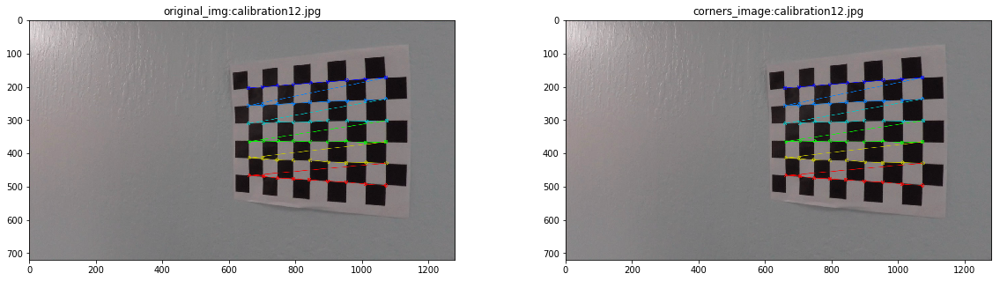

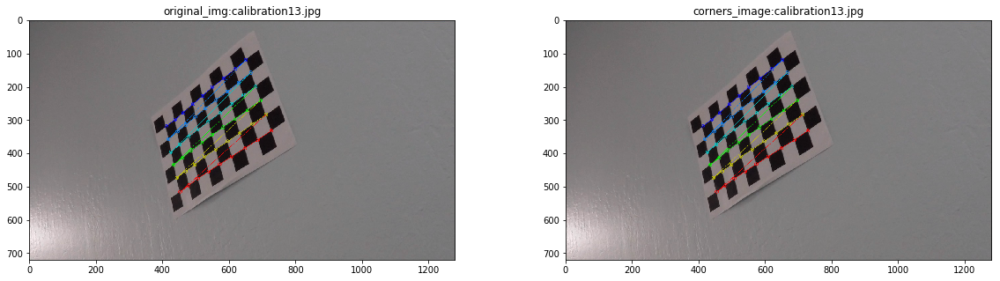

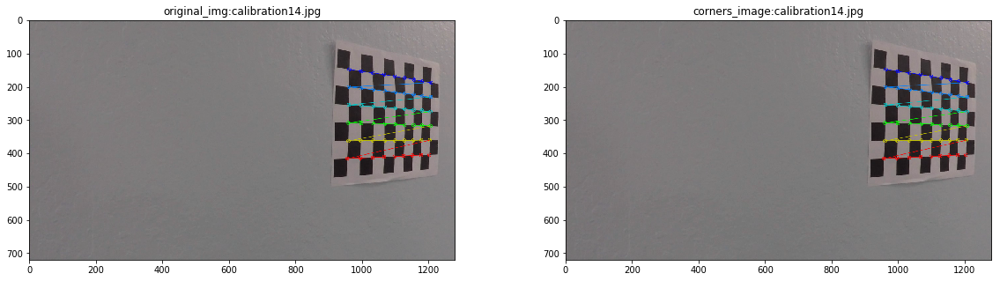

...

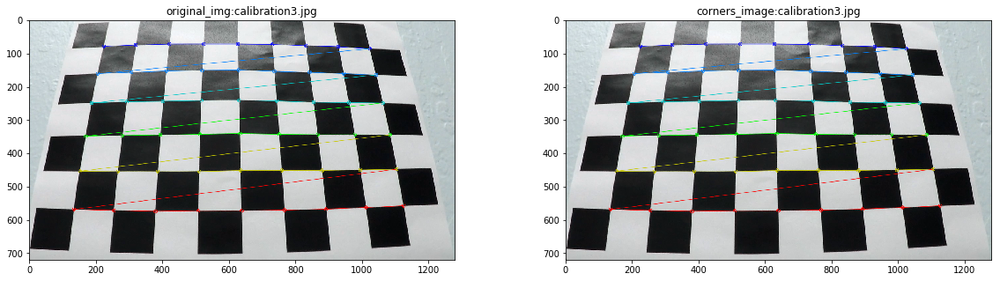

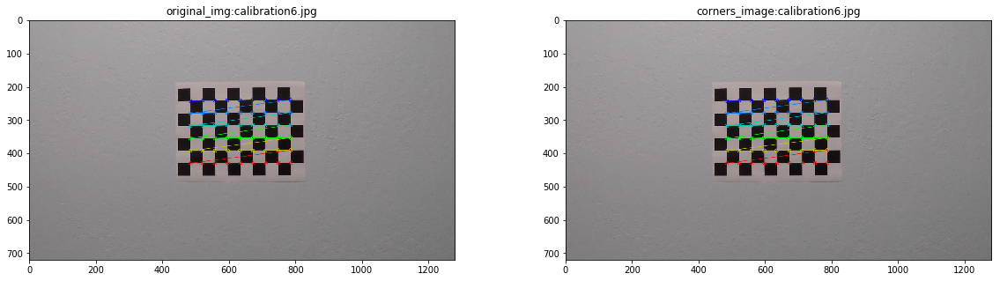

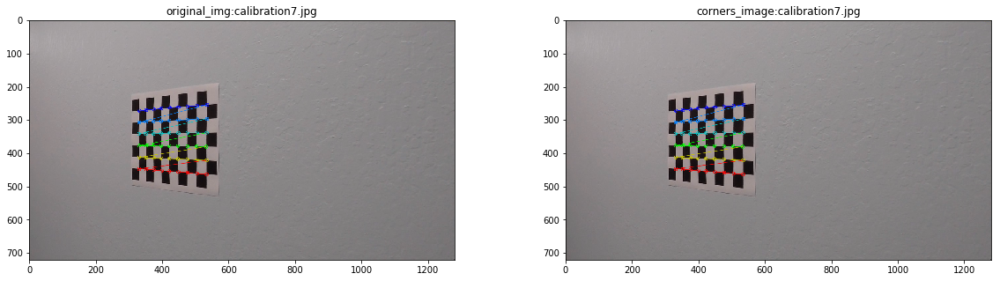

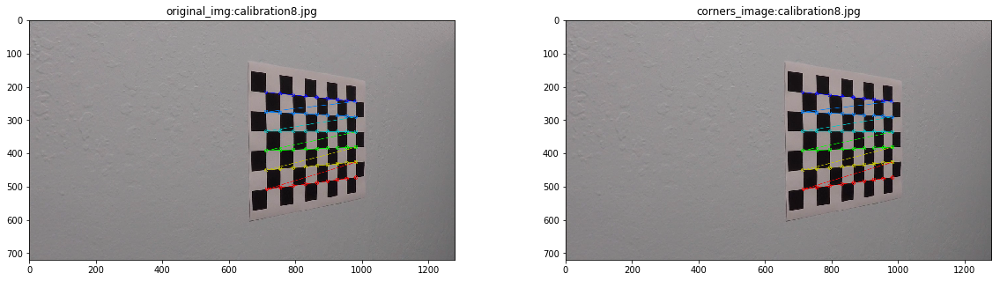

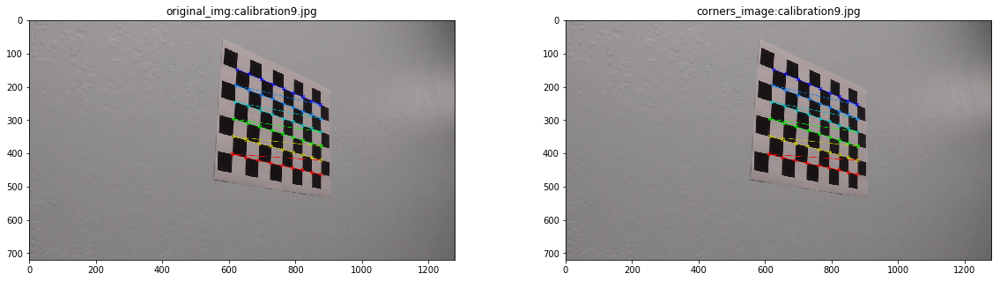

In [2]:
def display_corners(fname, original_img, corners, ret):
    corners_image = cv2.drawChessboardCorners(img, (9,6), corners, ret)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,5))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(fname))
    ax2.imshow(corners_image)
    ax2.set_title('corners_image:' + os.path.basename(fname))
    
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
cal_images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in cal_images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        display_corners(fname, img, corners, ret)
        

## Then undistort the image and visualize

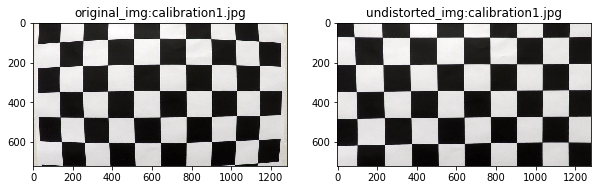

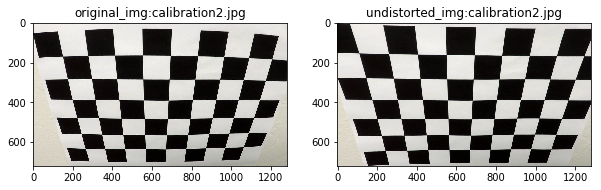

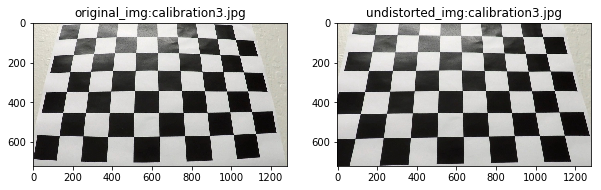

In [3]:
cal_img_11 = cv2.imread(cal_images[11])
gray_cal_img_11 = cv2.cvtColor(cal_img_11, cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, 
                                                   gray_cal_img_11.shape[::-1], None, None)
    
def cal_undistort(img, objpoints = objpoints, imgpoints = imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    undist = dst = cv2.undistort(img, mtx, dist, None, mtx)
    return undist


def display_undistorted(image_path):
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    undistorted_img = cal_undistort(original_img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(image_path))
    ax2.imshow(undistorted_img)
    ax2.set_title('undistorted_img:' + os.path.basename(image_path))
    
display_undistorted(cal_images[0])
display_undistorted(cal_images[11])
display_undistorted(cal_images[13])

## Load the test images


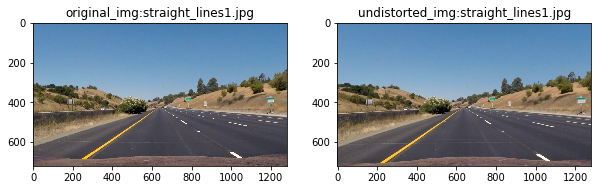

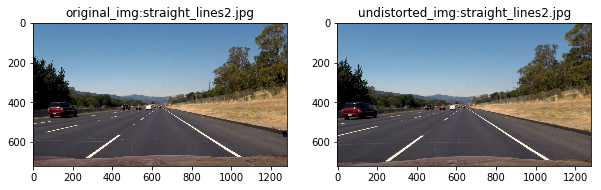

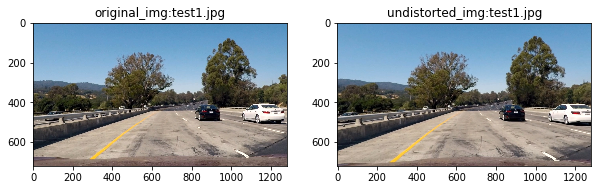

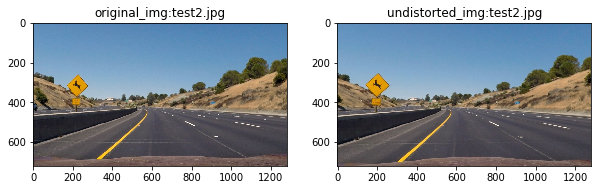

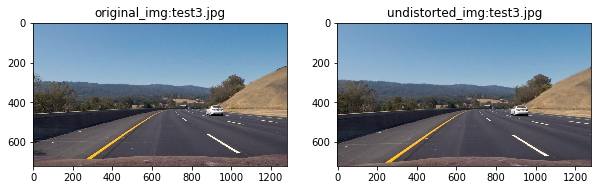

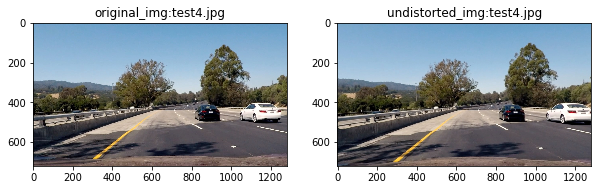

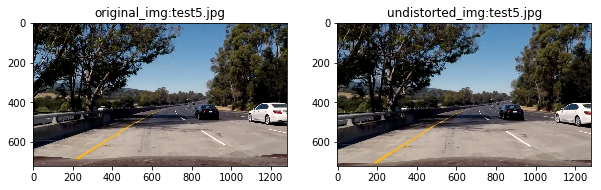

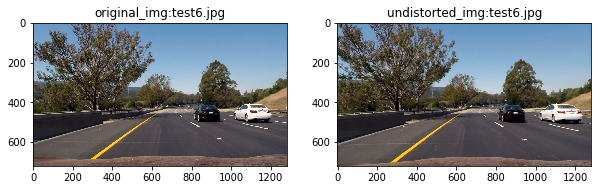

In [4]:
test_images = glob.glob('test_images/*.jpg')

for img in test_images:
    display_undistorted(img)
    

## visualize an image for warping

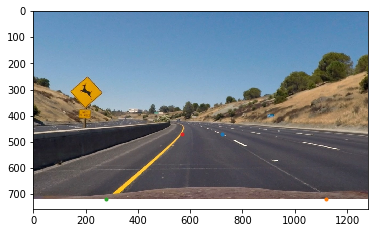

In [5]:
straight_0 = cv2.imread(test_images[3])
straight_0 = cv2.cvtColor(straight_0, cv2.COLOR_BGR2RGB)
undistorted_straight_0 = cal_undistort(straight_0)
plt.imshow(undistorted_straight_0)

src = np.float32([[722, 470],[1120, 720],
                      [280,720],[570, 470]])
for point in src:
    plt.plot(point[0], point[1],".")

## Perspective Transform

Define the perspective transform function and visualize

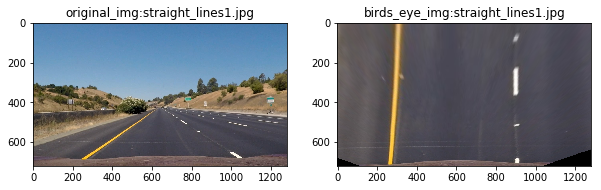

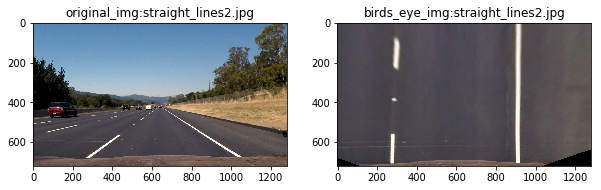

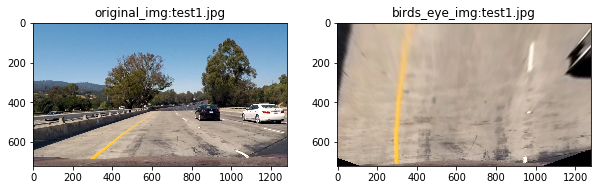

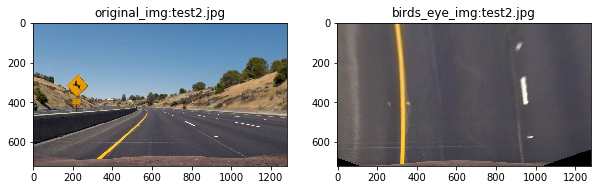

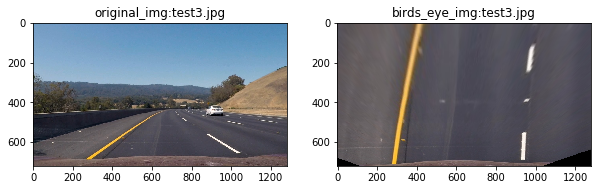

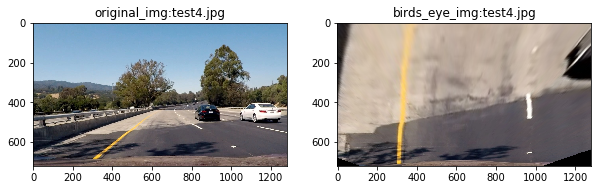

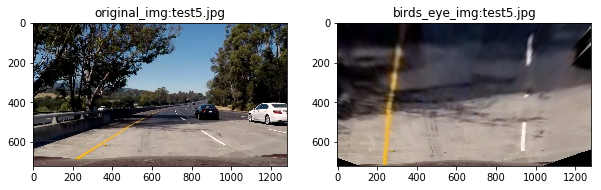

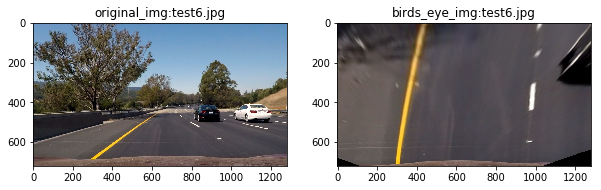

In [6]:

def warpPerspective(img, to_birds_eye=True):
    img_size = (img.shape[1], img.shape[0])
    
    src = np.float32([[722, 470],[1120, 720],
                      [280,720],[570, 470]])
    dst = np.float32([[920, 0], [920, 720], 
                      [320,720],[320, 0]])
        
    if to_birds_eye == False :
        src, dst = dst, src
    M = cv2.getPerspectiveTransform(src, dst)
    return cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
def display_warped(image_path):
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    undistorted_img = cal_undistort(original_img)
    
    birds_eye_img =  warpPerspective(undistorted_img)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(image_path))
    ax2.imshow(birds_eye_img)
    ax2.set_title('birds_eye_img:' + os.path.basename(image_path))
    
for img in test_images:
    display_warped(img)

## Pipeline for images
Threshhold in color space for S and L and then the yellow
and find the sobel binary in the x plane and angles close to center


In [7]:
def Get_S_Img(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    S = hls[:,:,2]
    thresh = (100, 255)
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary

def Get_L_Img(image):
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    thresh = 100
    binary = np.zeros_like(L)
    binary[(L > thresh)] = 1
    return binary

def Get_Yellow(image):
    threshold = 150
    R = image[:,:,0]
    G = image[:,:,1]
    yellow = np.zeros_like(R)
    yellow[(R > threshold) & (G > threshold)] = 1
    return yellow
    
def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Return the result
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def Get_Sobel_IMG(img):
    gradx = abs_sobel_thresh(img, 'x', 10, 200)
    dir_binary = dir_threshold(img, thresh=(np.pi/6, np.pi/2))
    sobel = np.zeros_like(gradx)
    sobel[(gradx == 1) & (dir_binary == 1)] = 1
    return sobel
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def process(image_path):
    original_img = cv2.imread(image_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    undistorted_img = cal_undistort(original_img)
    birds_eye = warpPerspective(undistorted_img)
    
    sobel = Get_Sobel_IMG(birds_eye)
    
    s_img = Get_S_Img(birds_eye)
    white = Get_L_Img(birds_eye)
    yellow = Get_Yellow(birds_eye)    
    
    lanes = np.zeros_like(yellow)
    lanes[((yellow == 1) | (white == 1)) & ((s_img == 1) | (sobel == 1))] = 1    
        
    #birds_eye_lanes = warpPerspective(lanes)
    
    final_img = lanes
    return [original_img, final_img]

def displayProcessed(image_path):
    original_img, final_img = process(image_path)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(image_path))
    ax2.imshow(final_img, cmap='gray')
    ax2.set_title('pre-process:' + os.path.basename(image_path))

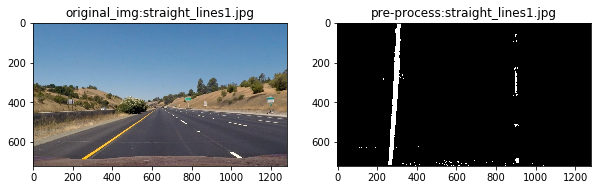

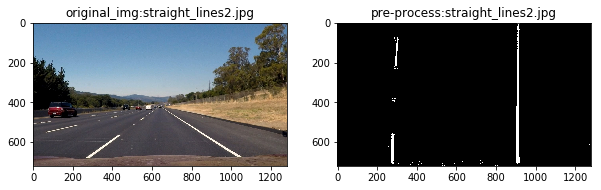

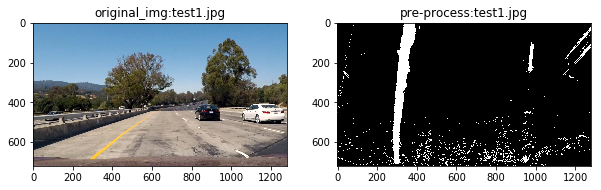

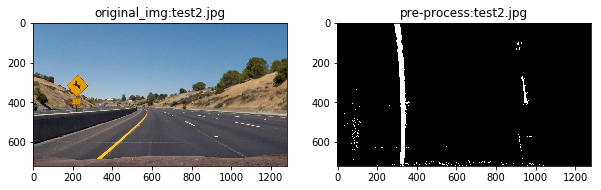

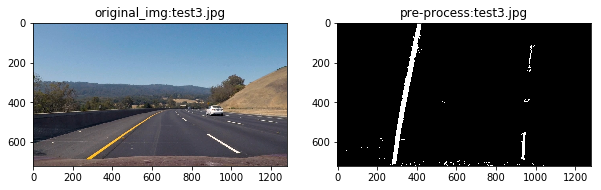

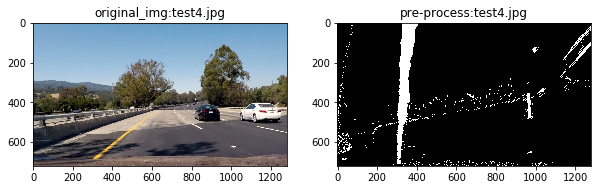

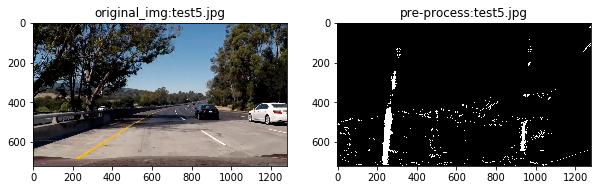

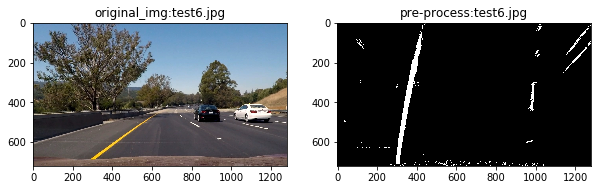

In [8]:
for img in test_images:
    displayProcessed(img)

## see histogram of procesed image

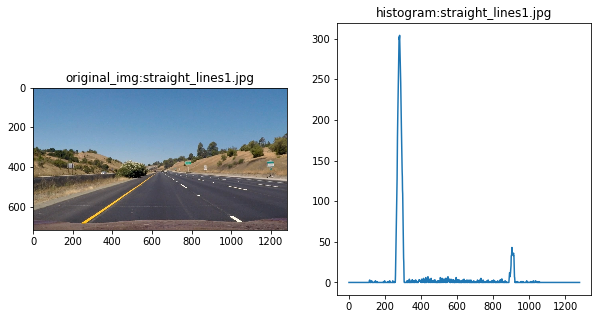

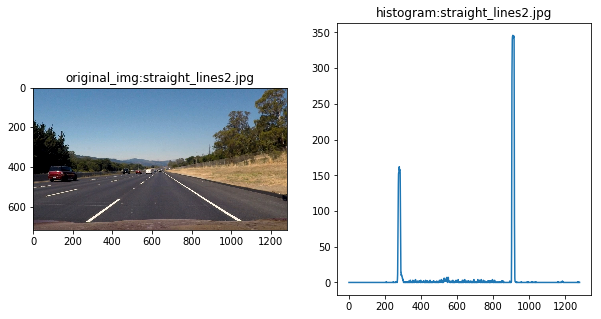

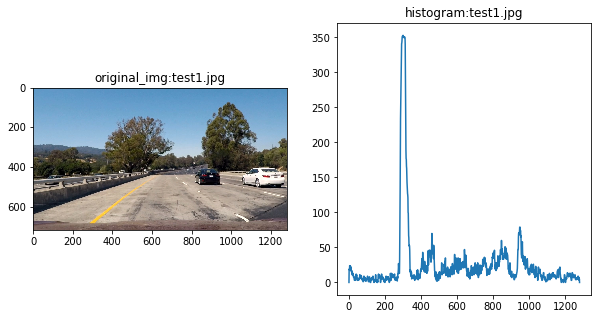

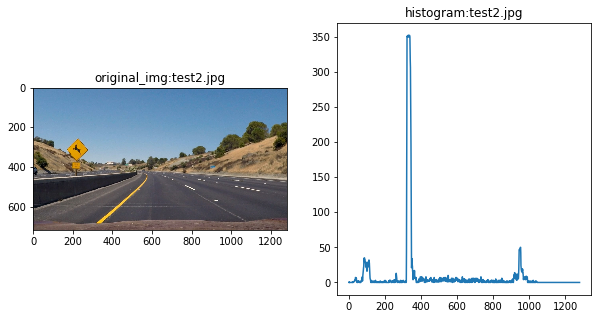

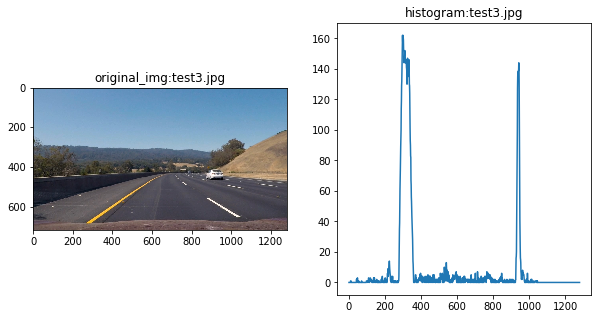

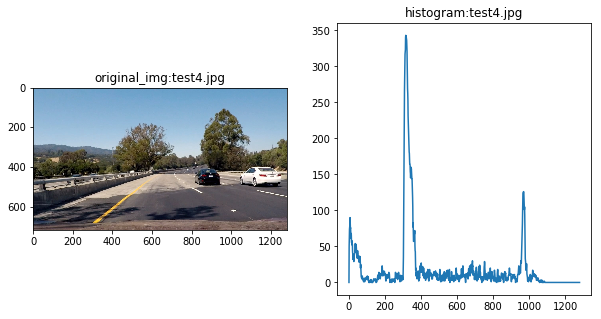

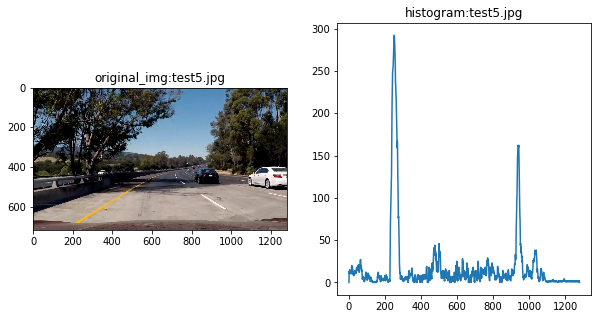

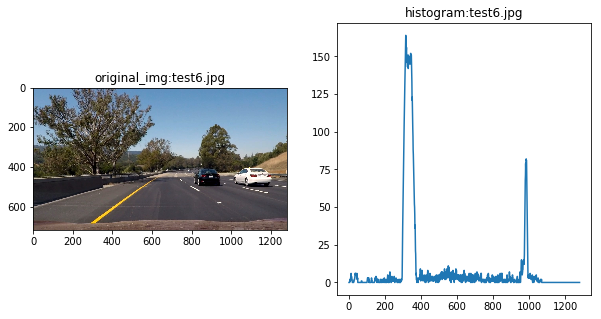

In [9]:
def displayHist(image_path):
    original_img, processed_img = process(image_path)
    histogram = np.sum(processed_img[processed_img.shape[0]//2:,:], axis=0)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,5))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(image_path))
    ax2.plot(histogram)
    ax2.set_title('histogram:' + os.path.basename(image_path))

for img in test_images:
    displayHist(img)

## Get left and right lanes

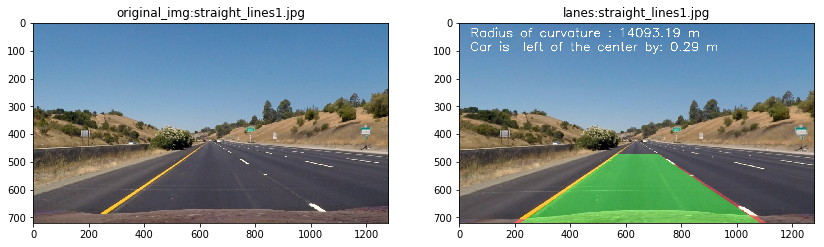

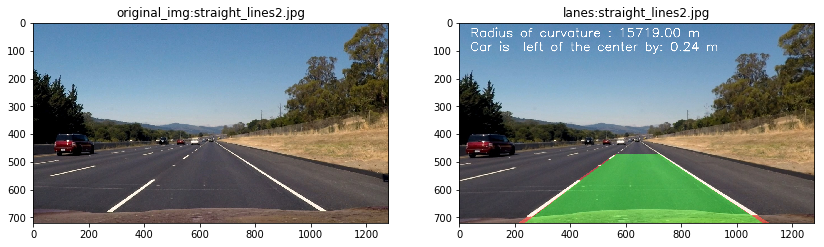

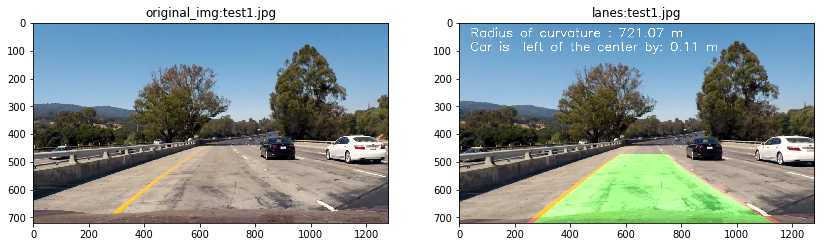

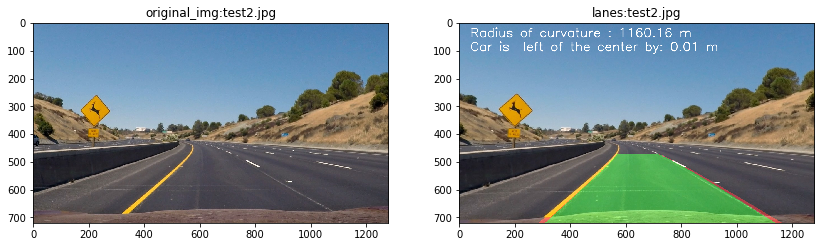

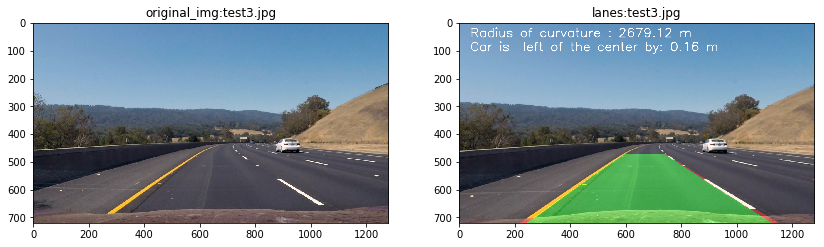

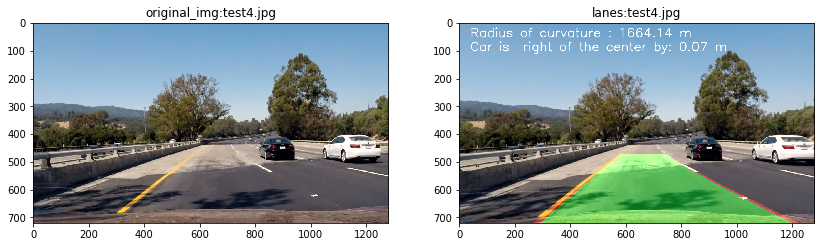

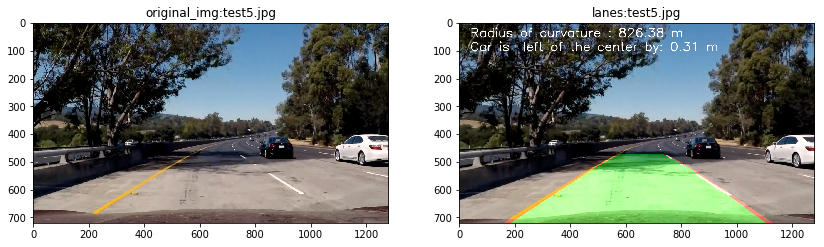

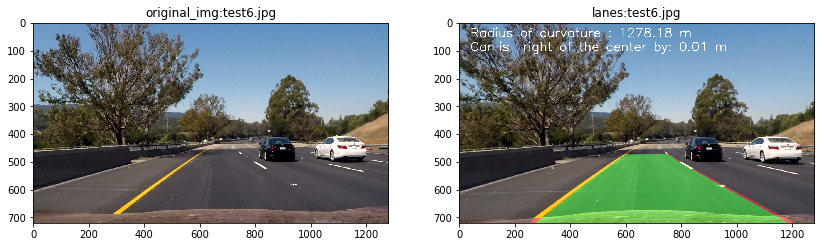

In [10]:
def GetLanesPoly(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return [left_fitx, right_fitx, ploty, left_fit, right_fit]

def getFilledImage(processed_img):
    warp_zero = np.zeros_like(processed_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    left_fitx, right_fitx, ploty, left_fit, right_fit = GetLanesPoly(processed_img)
    left_line = np.array(np.transpose(np.vstack([left_fitx, ploty])))
    right_line = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
    poly_points = np.vstack([left_line, right_line])    
    cv2.fillPoly(color_warp, np.int_([poly_points]), [0,255, 0])
    cv2.polylines(color_warp, np.int32([left_line]), isClosed=False, color=(255,0,0), thickness=15)
    cv2.polylines(color_warp, np.int32([right_line]), isClosed=False, color=(255,0,0), thickness=15)
    color_unwarp = warpPerspective(color_warp, to_birds_eye=False)
    return [color_unwarp, left_fit, right_fit, left_fitx, right_fitx, ploty]

def weighted_img(img, initial_img, α=1., β=.4, λ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + λ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

def radius(leftx, rightx, ploty):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    y_eval = np.max(ploty)

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    return "Radius of curvature : %.2f m" % ((left_curverad+right_curverad)/2)

def center(leftx, rightx, image):
    xm_per_pix = 3.7/700
    
    midx = image.shape[1]/2
    lanex = (leftx[-1] + rightx[-1]) /2
    center_dist = (midx - lanex) * xm_per_pix
    dir = "left"
    if center_dist < 0 :
        dir = "right"
        center_dist = - center_dist
    return "Car is  " + dir + " of the center by: %.2f m" % (center_dist)

def displayLanes(image_path):
    original_img, processed_img = process(image_path)
    poly_img, left_fit, right_fit, left_fitx, right_fitx, ploty = getFilledImage(processed_img)
    
    rad = radius(left_fitx, right_fitx, ploty)
    cent = center(left_fitx, right_fitx, original_img)
                                    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,10))
    ax1.imshow(original_img)
    ax1.set_title('original_img:' + os.path.basename(image_path))
    final =  weighted_img(poly_img, cal_undistort(original_img))
    
    cv2.putText(final,rad , (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(final,cent , (40, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    
    ax2.imshow(final)
    ax2.set_title('lanes:' + os.path.basename(image_path))

for img in test_images:
    displayLanes(img)

## Process Video

In [11]:
def GetLanesFast(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    return [left_fitx, right_fitx, ploty, left_fit, right_fit]
    
class Lanes():
    def __init__(self):
        self.fast = False
        self.leftx = []
        self.rightx = []
        self.left_fit = []
        self.right_fit= []
        self.left_history = [] 
        self.right_history = []
        
    def getAverageLines(self, left_fitx, right_fitx):
        frames = 20
        
        #if left_fitx == None or left_fitx == [] :
        #    print("left is:", left_fitx)
        
        #if right_fitx == None or right_fitx == [] :
         #   print("left is:", right_fitx)
        
        if left_fitx != None and left_fitx != [] :
            self.left_history += [left_fitx]
            
        if right_fitx != None and right_fitx != [] :   
            self.right_history += [right_fitx]
            
        if(len(self.left_history) > frames):
            self.left_history.pop(0)
        
        if(len(self.right_history) > frames):
            self.right_history.pop(0)
            
        new_left_fitx = np.zeros_like(left_fitx)
        new_right_fitx = np.zeros_like(right_fitx)
        
        for line in self.left_history:
            new_left_fitx += line
        new_left_fitx /= len(self.left_history)
        
        for line in self.right_history:
            new_right_fitx += line
        new_right_fitx /= len(self.right_history)
        
        return new_left_fitx, new_right_fitx

    def getFilledImage(self, processed_img):
        warp_zero = np.zeros_like(processed_img).astype(np.uint8)
        color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

        if self.fast == True:
            left_fitx, right_fitx, ploty, self.left_fit, self.right_fit = GetLanesFast(processed_img, 
                                                                              self.left_fit, self.right_fit)
        else:            
            left_fitx, right_fitx, ploty, self.left_fit, self.right_fit = GetLanesPoly(processed_img)
            self.fast = True
            
        left_fitx, right_fitx = self.getAverageLines(left_fitx, right_fitx)
            
        left_line = np.array(np.transpose(np.vstack([left_fitx, ploty])))
        right_line = np.array(np.flipud(np.transpose(np.vstack([right_fitx, ploty]))))
        poly_points = np.vstack([left_line, right_line])    
        cv2.fillPoly(color_warp, np.int_([poly_points]), [0,255, 0])
        cv2.polylines(color_warp, np.int32([left_line]), isClosed=False, color=(255,0,0), thickness=15)
        cv2.polylines(color_warp, np.int32([right_line]), isClosed=False, color=(255,0,0), thickness=15)
    
        color_unwarp = warpPerspective(color_warp, to_birds_eye=False)
        return [color_unwarp,left_fitx, right_fitx, ploty]
    
    def video(self, original_img):
        undistorted_img = cal_undistort(original_img)
        birds_eye = warpPerspective(undistorted_img)

        sobel = Get_Sobel_IMG(birds_eye)

        s_img = Get_S_Img(birds_eye)
        white = Get_L_Img(birds_eye)
        yellow = Get_Yellow(birds_eye)    

        lanes = np.zeros_like(yellow)
        lanes[((yellow == 1) | (white == 1)) & ((s_img == 1) | (sobel == 1))] = 1
        final = lanes
        poly_img,left_fitx, right_fitx, ploty = self.getFilledImage(final)
        final2 =  weighted_img(poly_img, cal_undistort(original_img))
        rad = radius(left_fitx, right_fitx, ploty)
        cent = center(left_fitx, right_fitx, original_img)
        cv2.putText(final2,rad , (40, 50), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
        cv2.putText(final2,cent , (40, 100), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
        return final2

In [12]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

lanes = Lanes()

project_output = 'proccessed_project_video.mp4'

clip1 = VideoFileClip("project_video.mp4")
project_clip = clip1.fl_image(lanes.video) #NOTE: this function expects color images!!
%time project_clip.write_videofile(project_output, audio=False)


[MoviePy] >>>> Building video proccessed_project_video.mp4
[MoviePy] Writing video proccessed_project_video.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [06:17<00:00,  3.40it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: proccessed_project_video.mp4 

Wall time: 6min 19s
